# European Parliament election results in Pest County (Hungary) - 2019

# 1. Loading data, necessary packages and creating geojson file

A, Loading necessary packages

In [1]:
import osmnx as ox # read more about it right below
import pandas as pd
import fiona
import geopandas as gpd
import numpy as np


import matplotlib.pyplot as plt
import seaborn as sns

import folium
import branca

%matplotlib inline
ox.config(log_file=True, log_console=True, use_cache=True)

For creating geojson files based on the names of certain towns I used the package called osmnx created by Geoff Boeing. For more information about this package visit his website, it is absolutely worth it:

https://geoffboeing.com/2016/11/osmnx-python-street-networks/

For being able to run every code in this notebook I created a virtual environment which contains the following packages: geopandas, rtree, osmnx, overpy. Install these if some problem appered while running the notebook!

B, Loading data from excel and some formatting

In [2]:
EP_data = pd.read_excel('EP2019_pest county_hungary.xlsx', sheet_name='town level data')

In [3]:
EP_data.head()

,town_name,N_voters,N_valid_votes,jobbik_avg,fidesz_avg,momentum_avg,mh_avg,mszp-p_avg,lmp_avg,dk_avg,mp_avg,mkkp_avg
0,Abony,11572,3866,6.526563,59.818391,5.642219,5.151267,4.083207,1.721920,14.624867,0.576625,1.854940
1,Acsa,1132,348,5.747126,65.517241,5.747126,3.160920,3.448276,0.574713,14.367816,0.287356,1.149425
2,Albertirsa,10279,3740,6.203680,52.838998,8.863236,3.183949,6.643793,2.398538,16.466515,0.311910,3.089383
3,Alsónémedi,4068,1689,6.334457,62.337688,7.410110,4.552964,3.839906,1.696499,11.546138,0.231134,2.051104
4,Apaj,944,271,10.701107,45.018450,7.011070,7.749077,7.011070,2.583026,18.450185,0.369004,1.107011


C, Formatting the names of the towns in order to have better results in request, using osmnx

In [4]:
towns = []

places = EP_data.town_name.tolist()
#places

for i in places:
    towns.append(i+', Hungary')

In [5]:
towns[0:5]

['Abony, Hungary',
 'Acsa, Hungary',
 'Albertirsa, Hungary',
 'Alsónémedi, Hungary',
 'Apaj, Hungary']

D, Requesting administrative boundaries of the towns (geopandas file)

In [6]:
town_loc = ox.gdf_from_places(towns)
type(town_loc)

geopandas.geodataframe.GeoDataFrame

In [7]:
town_loc.head()

,geometry,place_name,bbox_north,bbox_south,bbox_east,bbox_west
0,"POLYGON ((19.92464 47.17159, 19.93780 47.15740...","Abony, Ceglédi járás, Pest megye, Central Hung...",47.253740,47.124270,20.099305,19.924643
1,"POLYGON ((19.33616 47.79293, 19.33841 47.79178...","Acsa, Váci járás, Pest megye, Central Hungary,...",47.822091,47.767604,19.446413,19.336159
2,"POLYGON ((19.55510 47.24920, 19.55963 47.24539...","Albertirsa, Ceglédi járás, Pest megye, Central...",47.306500,47.185130,19.709674,19.555099
3,"POLYGON ((19.12529 47.30858, 19.13359 47.30227...","Alsónémedi, Gyáli járás, Pest megye, Central H...",47.361073,47.249558,19.222216,19.125290
4,"POLYGON ((19.07200 47.15872, 19.08013 47.14771...","Apaj, Ráckevei járás, Pest megye, Central Hung...",47.194415,47.045094,19.168676,19.072000


Sometimes the request does not work properly, it does not give back the boundaries of a town, but its location with one single coordinate. The following lines are supposed to fix this problem in case it appered.

In [8]:
for i, j in zip(town_loc['geometry'], list(range(len(town_loc['geometry'])))):
    
    if i.geom_type is 'Point':
        print(i)
        not_poly =  ox.gdf_from_place(towns[j], which_result=2)
        try:
            town_loc.loc[j, 'geometry'] = not_poly.loc[0, 'geometry']
            town_loc.loc[j, 'place_name'] = not_poly.loc[0, 'place_name']
        except:
            continue

In [9]:
town_loc.head()

,geometry,place_name,bbox_north,bbox_south,bbox_east,bbox_west
0,"POLYGON ((19.92464 47.17159, 19.93780 47.15740...","Abony, Ceglédi járás, Pest megye, Central Hung...",47.253740,47.124270,20.099305,19.924643
1,"POLYGON ((19.33616 47.79293, 19.33841 47.79178...","Acsa, Váci járás, Pest megye, Central Hungary,...",47.822091,47.767604,19.446413,19.336159
2,"POLYGON ((19.55510 47.24920, 19.55963 47.24539...","Albertirsa, Ceglédi járás, Pest megye, Central...",47.306500,47.185130,19.709674,19.555099
3,"POLYGON ((19.12529 47.30858, 19.13359 47.30227...","Alsónémedi, Gyáli járás, Pest megye, Central H...",47.361073,47.249558,19.222216,19.125290
4,"POLYGON ((19.07200 47.15872, 19.08013 47.14771...","Apaj, Ráckevei járás, Pest megye, Central Hung...",47.194415,47.045094,19.168676,19.072000


E, Keeping only the names of the towns (deleting any other adminstrative information about them)

In [10]:
for i, j in zip(list(range(len(town_loc.place_name))),town_loc.place_name):
    split = j.split(',')
    #print(split)
    
    town_loc.place_name[i] = split[0]

C:\Users\Sanyi\.conda\envs\pr_maps\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [11]:
town_loc.head()

,geometry,place_name,bbox_north,bbox_south,bbox_east,bbox_west
0,"POLYGON ((19.92464 47.17159, 19.93780 47.15740...",Abony,47.253740,47.124270,20.099305,19.924643
1,"POLYGON ((19.33616 47.79293, 19.33841 47.79178...",Acsa,47.822091,47.767604,19.446413,19.336159
2,"POLYGON ((19.55510 47.24920, 19.55963 47.24539...",Albertirsa,47.306500,47.185130,19.709674,19.555099
3,"POLYGON ((19.12529 47.30858, 19.13359 47.30227...",Alsónémedi,47.361073,47.249558,19.222216,19.125290
4,"POLYGON ((19.07200 47.15872, 19.08013 47.14771...",Apaj,47.194415,47.045094,19.168676,19.072000


F, Keeping only the necessary variables, renaming them and merging the original data with the administrative boundaries.

In [12]:
town_loc = town_loc[['geometry', 'place_name']]

In [13]:
EP_data = EP_data.rename({'town_name':'place_name'}, axis='columns')

In [14]:
town_loc = town_loc.merge(EP_data, on = 'place_name')

In [15]:
town_loc.head()

,geometry,place_name,N_voters,N_valid_votes,jobbik_avg,fidesz_avg,momentum_avg,mh_avg,mszp-p_avg,lmp_avg,dk_avg,mp_avg,mkkp_avg
0,"POLYGON ((19.92464 47.17159, 19.93780 47.15740...",Abony,11572,3866,6.526563,59.818391,5.642219,5.151267,4.083207,1.721920,14.624867,0.576625,1.854940
1,"POLYGON ((19.33616 47.79293, 19.33841 47.79178...",Acsa,1132,348,5.747126,65.517241,5.747126,3.160920,3.448276,0.574713,14.367816,0.287356,1.149425
2,"POLYGON ((19.55510 47.24920, 19.55963 47.24539...",Albertirsa,10279,3740,6.203680,52.838998,8.863236,3.183949,6.643793,2.398538,16.466515,0.311910,3.089383
3,"POLYGON ((19.12529 47.30858, 19.13359 47.30227...",Alsónémedi,4068,1689,6.334457,62.337688,7.410110,4.552964,3.839906,1.696499,11.546138,0.231134,2.051104
4,"POLYGON ((19.07200 47.15872, 19.08013 47.14771...",Apaj,944,271,10.701107,45.018450,7.011070,7.749077,7.011070,2.583026,18.450185,0.369004,1.107011


G, Is there any missing data?

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 187 entries, 0 to 186
Data columns (total 13 columns):
geometry         187 non-null geometry
place_name       187 non-null object
N_voters         187 non-null int64
N_valid_votes    187 non-null int64
jobbik_avg       187 non-null float64
fidesz_avg       187 non-null float64
momentum_avg     187 non-null float64
mh_avg           187 non-null float64
mszp-p_avg       187 non-null float64
lmp_avg          187 non-null float64
dk_avg           187 non-null float64
mp_avg           187 non-null float64
mkkp_avg         187 non-null float64
dtypes: float64(9), geometry(1), int64(2), object(1)
memory usage: 19.0+ KB


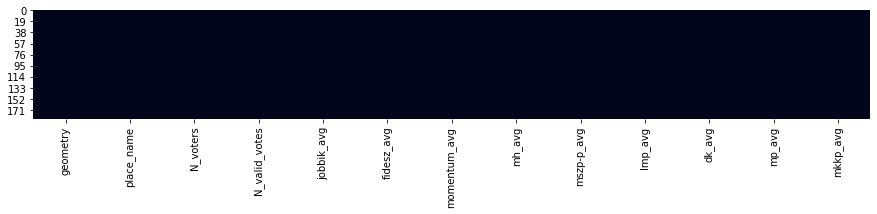

In [16]:
town_loc.info()
plt.figure(figsize=(15,2))
sns.heatmap(town_loc.isnull(), cbar=False) # tel.isnull() is for finding missing values

H, Creating geojson file from the existing geopandas file (later I will be using folium to create visualisations and with that it is easier to use geojson)

In [17]:
town_loc_gjson = town_loc.__geo_interface__

In [18]:
town_loc_gjson

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'N_valid_votes': 3866,
    'N_voters': 11572,
    'dk_avg': 14.624866650934631,
    'fidesz_avg': 59.81839112466713,
    'jobbik_avg': 6.526563426707137,
    'lmp_avg': 1.7219201880832147,
    'mh_avg': 5.151267400412587,
    'mkkp_avg': 1.8549399777967548,
    'momentum_avg': 5.642219278985026,
    'mp_avg': 0.5766249183588219,
    'mszp-p_avg': 4.0832070340547055,
    'place_name': 'Abony'},
   'geometry': {'type': 'Polygon',
    'coordinates': (((19.9246432, 47.1715877),
      (19.937802, 47.1573982),
      (19.9410648, 47.1520426),
      (19.9521445, 47.1470034),
      (19.9610272, 47.1442677),
      (19.9727434, 47.1441736),
      (19.9816312, 47.1418144),
      (19.9938221, 47.1367683),
      (19.9971299, 47.1348319),
      (20.0027009, 47.1340294),
      (20.0071251, 47.1320834),
      (20.0137965, 47.1308868),
      (20.0182361, 47.1293245),
      (20.0237762, 47.1273746),
      (20.

# 02. Visualisations (maps) with folium 

A, Creating colorscales for the different parties using the package called branca.

For more information about it: https://python-visualization.github.io/branca/index.html

The colors are the official colors used by the parties, I identified them using this page: https://imagecolorpicker.com/

For the maps I used different shades of these which are from this page: https://www.colorhexa.com/

In [19]:
colorscale_fidesz = branca.colormap.LinearColormap(
    ['white','#ff9346','#f86700', '#ac4700'],
    vmin=EP_data.fidesz_avg.min(), vmax=EP_data.fidesz_avg.max()).to_step(4)

colorscale_fidesz

In [20]:
colorscale_momentum = branca.colormap.LinearColormap(
    ['white','#bba8e1','#8e6fce', '#643db3'],
    vmin=EP_data.momentum_avg.min(), vmax=EP_data.momentum_avg.max()).to_step(4)

colorscale_momentum

In [21]:
colorscale_jobbik = branca.colormap.LinearColormap(
    ['white','#02e0da','#019490', '#004846'],
    vmin=EP_data.jobbik_avg.min(), vmax=EP_data.jobbik_avg.max()).to_step(4)

colorscale_jobbik

In [22]:
colorscale_mihazank = branca.colormap.LinearColormap(
    ['white','#97cd27','#688d1b', '#394d0f'],
    vmin=EP_data.mh_avg.min(), vmax=EP_data.mh_avg.max()).to_step(4)

colorscale_mihazank

In [23]:
colorscale_mszpp = branca.colormap.LinearColormap(
    ['white','#ea4648','#cd1719', '#880f11'],
    vmin=EP_data['mszp-p_avg'].min(), vmax=EP_data['mszp-p_avg'].max()).to_step(4)

colorscale_mszpp

In [24]:
colorscale_lmp = branca.colormap.LinearColormap(
    ['white','#a4d57c','#7cc242', '#578b2d'],
    vmin=EP_data.lmp_avg.min(), vmax=EP_data.lmp_avg.max()).to_step(4)

colorscale_lmp

In [25]:
colorscale_dk = branca.colormap.LinearColormap(
    ['white','#0095f9','#0067ac', '#003960'],
    vmin=EP_data.dk_avg.min(), vmax=EP_data.dk_avg.max()).to_step(4)

colorscale_dk

In [26]:
colorscale_munkaspart = branca.colormap.LinearColormap(
    ['white','#e93e45','#c5161d', '#800e13'],
    vmin=EP_data.mp_avg.min(), vmax=EP_data.mp_avg.max()).to_step(4)

colorscale_munkaspart

In [27]:
colorscale_mkkp = branca.colormap.LinearColormap(
    ['white','#a6a6a6','#5a5a5a', '#000000'],
    vmin=EP_data.mkkp_avg.min(), vmax=EP_data.mkkp_avg.max()).to_step(4)

colorscale_mkkp

B, Creating pandas series for the certain parties using place names as index

In [28]:
fidesz_avg = EP_data.set_index('place_name')['fidesz_avg']

In [29]:
momentum_avg = EP_data.set_index('place_name')['momentum_avg']

In [30]:
jobbik_avg = EP_data.set_index('place_name')['jobbik_avg']

In [31]:
mihazank_avg = EP_data.set_index('place_name')['mh_avg']

In [32]:
mszpp_avg = EP_data.set_index('place_name')['mszp-p_avg']

In [33]:
lmp_avg = EP_data.set_index('place_name')['lmp_avg']

In [34]:
dk_avg = EP_data.set_index('place_name')['dk_avg']

In [35]:
munkaspart_avg = EP_data.set_index('place_name')['mp_avg']

In [36]:
mkkp_avg = EP_data.set_index('place_name')['mkkp_avg']

### Map not using FeatureGroup.

C, In this case every layer can be shown at the same time and if you would like to see only one layer, you have to uncheck every other layer.

In [37]:
map1 = folium.Map(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4)

In [38]:
#Fidesz
folium.GeoJson(
    town_loc_gjson,
    name = 'Fidesz',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'fidesz_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_fidesz(fidesz_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    }
).add_to(map1)

###############################################################################################################################

#Momentum
folium.GeoJson(
    town_loc_gjson,
    name = 'Momentum',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'momentum_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_momentum(momentum_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.9,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

#Jobbik
folium.GeoJson(
    town_loc_gjson,
    name = 'Jobbik',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'jobbik_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_jobbik(jobbik_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

#Mihazank
folium.GeoJson(
    town_loc_gjson,
    name = 'Mi hazánk',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'mh_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_mihazank(mihazank_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

#Mszpp
folium.GeoJson(
    town_loc_gjson,
    name = 'MSZP-P',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'mszp-p_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_mszpp(mszpp_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

#LMP
folium.GeoJson(
    town_loc_gjson,
    name = 'LMP',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'lmp_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_lmp(lmp_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

#DK
folium.GeoJson(
    town_loc_gjson,
    name = 'DK',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'dk_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_dk(dk_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

#Munkaspart
folium.GeoJson(
    town_loc_gjson,
    name = 'Munkáspárt',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name','mp_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_munkaspart(munkaspart_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

#MKKP
folium.GeoJson(
    town_loc_gjson,
    name = 'MKKP',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'mkkp_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_mkkp(mkkp_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False,
).add_to(map1)

###############################################################################################################################

folium.LayerControl().add_to(map1)

In [39]:
map1

In [40]:
map1.save('map1.html')

### Map using FeatureGroup

D, In this case only one layer will be shown at the same time. You do not have to uncheck layers to see only one, this problem is solved in this case.

In [41]:
map2 = folium.Map(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4)

In [42]:
#FeatureGroup Fidesz
fg_fidesz = folium.FeatureGroup(name = 'Fidesz', overlay=False)

#Fidesz
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_fidesz)

folium.GeoJson(
    town_loc_gjson,
    name = 'Fidesz',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'fidesz_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_fidesz(fidesz_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    },
    show = False
).add_to(fg_fidesz)

###############################################################################################################################

#FeatureGroup Momentum
fg_momentum = folium.FeatureGroup(name = 'Momentum', overlay=False)

#Momentum
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_momentum)

folium.GeoJson(
    town_loc_gjson,
    name = 'Momentum',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'momentum_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_momentum(momentum_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.9,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_momentum)

###############################################################################################################################

#FeatureGroup Jobbik
fg_jobbik = folium.FeatureGroup(name = 'Jobbik', overlay=False)

#Jobbik
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_jobbik)

folium.GeoJson(
    town_loc_gjson,
    name = 'Jobbik',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'jobbik_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_jobbik(jobbik_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_jobbik)

###############################################################################################################################

#FeatureGroup Mihazank
fg_mihazank = folium.FeatureGroup(name = 'Mi hazánk', overlay=False)

#Mihazank
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_mihazank)

folium.GeoJson(
    town_loc_gjson,
    name = 'Mi hazánk',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'mh_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_mihazank(mihazank_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.7,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_mihazank)

###############################################################################################################################

#FeatureGroup Mszpp
fg_mszpp = folium.FeatureGroup(name = 'MSZP-P', overlay=False)

#Mszpp
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_mszpp)

folium.GeoJson(
    town_loc_gjson,
    name = 'MSZP-P',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'mszp-p_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_mszpp(mszpp_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.6,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_mszpp)

###############################################################################################################################

#FeatureGroup LMP
fg_lmp = folium.FeatureGroup(name = 'LMP', overlay=False)

#LMP
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_lmp)

folium.GeoJson(
    town_loc_gjson,
    name = 'LMP',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'lmp_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_lmp(lmp_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.8,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_lmp)

###############################################################################################################################

#FeatureGroup DK
fg_dk = folium.FeatureGroup(name = 'DK', overlay=False)

#DK
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_dk)

folium.GeoJson(
    town_loc_gjson,
    name = 'DK',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'dk_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_dk(dk_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.8,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_dk)

###############################################################################################################################

#FeatureGroup Munkaspart
fg_munkaspart = folium.FeatureGroup(name = 'Munkáspárt', overlay=False)

#Munkaspart
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_munkaspart)

folium.GeoJson(
    town_loc_gjson,
    name = 'Munkáspárt',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'mp_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_munkaspart(munkaspart_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.8,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_munkaspart)

###############################################################################################################################

#FeatureGroup MKKP
fg_mkkp = folium.FeatureGroup(name = 'MKKP', overlay=False)

#MKKP
folium.TileLayer(location=[47.424642, 19.129716], tiles='openstreetmap', zoom_start=8.4).add_to(fg_mkkp)

folium.GeoJson(
    town_loc_gjson,
    name = 'MKKP',
    tooltip = folium.features.GeoJsonTooltip(fields=['place_name', 'mkkp_avg'],
                                             aliases=['Town','Result (%)'], 
                                             labels=True, 
                                             sticky=True,
                                             localize=True),
    style_function = lambda feature: {
        'fillColor': colorscale_mkkp(mkkp_avg[feature['properties']['place_name']]),
        'fillOpacity': 0.8,
        'color': 'black',
        'weight': 1,
    }
).add_to(fg_mkkp)

###############################################################################################################################

#Adding FeatureGroups to map2 
fg_fidesz.add_to(map2)
fg_momentum.add_to(map2)
fg_jobbik.add_to(map2)
fg_mihazank.add_to(map2)
fg_mszpp.add_to(map2)
fg_lmp.add_to(map2)
fg_dk.add_to(map2)
fg_munkaspart.add_to(map2)
fg_mkkp.add_to(map2)

folium.LayerControl().add_to(map2)

In [43]:
map2

In [44]:
map2.save('map2.html')